# Импорт библиотек и загрузка данных

In [70]:
#from google.colab import files
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_curve, auc, roc_auc_score, ConfusionMatrixDisplay
import joblib
from imblearn.over_sampling import SMOTE
%matplotlib inline

In [2]:
#uploaded = files.upload()

In [3]:
df = pd.read_csv("dataset.csv")
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


# EDA

## Очистка данных

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [5]:
df = df.drop(columns=['id', 'Unnamed: 32'])

In [6]:
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [7]:
df.duplicated().sum()

0

In [111]:
cat_columns = []
num_columns = []
num_columns_mean = []
num_columns_se = []
num_columns_worst = []

for column_name in df.columns:
    if (df[column_name].dtypes == object):
        cat_columns.append(column_name)
    else:
        num_columns.append(column_name)
        if column_name.find('_mean') != -1:
          num_columns_mean.append(column_name)
        if column_name.find('_se') != -1:
          num_columns_se.append(column_name)
        if column_name.find('_worst') != -1:
          num_columns_worst.append(column_name)

print(f'Категориальные данные:\t {cat_columns} \n Число столбцов = {len(cat_columns)}')

print(f'Числовые данные:\t {num_columns} \n Число столбцов = {len(num_columns)}')

print(f'Средние:\t {num_columns_mean} \n Число столбцов = {len(num_columns_mean)}')

print(f'Стандартная ошибка:\t {num_columns_se} \n Число столбцов = {len(num_columns_se)}')

print(f'Worst:\t {num_columns_worst} \n Число столбцов = {len(num_columns_worst)}')

Категориальные данные:	 ['diagnosis'] 
 Число столблцов = 1
Числовые данные:	 ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst'] 
 Число столблцов = 30
Средние:	 ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'] 
 Число столблцов = 10
Стандартная ошибка:	 ['radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concav

In [9]:
for col in num_columns:
  print(f'В столбце: {col}\t количество уникальных значений:\t {df[col].nunique()}')

В столбце: radius_mean	 количество уникальных значений:	 456
В столбце: texture_mean	 количество уникальных значений:	 479
В столбце: perimeter_mean	 количество уникальных значений:	 522
В столбце: area_mean	 количество уникальных значений:	 539
В столбце: smoothness_mean	 количество уникальных значений:	 474
В столбце: compactness_mean	 количество уникальных значений:	 537
В столбце: concavity_mean	 количество уникальных значений:	 537
В столбце: concave points_mean	 количество уникальных значений:	 542
В столбце: symmetry_mean	 количество уникальных значений:	 432
В столбце: fractal_dimension_mean	 количество уникальных значений:	 499
В столбце: radius_se	 количество уникальных значений:	 540
В столбце: texture_se	 количество уникальных значений:	 519
В столбце: perimeter_se	 количество уникальных значений:	 533
В столбце: area_se	 количество уникальных значений:	 528
В столбце: smoothness_se	 количество уникальных значений:	 547
В столбце: compactness_se	 количество уникальных значе

## Анализ числовых признаков

In [109]:
def hist_plotting(data, name_columns, width=5):
  height = int(np.ceil(len(name_columns)/width))
  _, _ = plt.subplots(nrows=height, ncols=width, figsize=(20,6))

  for idx, column_name in enumerate(name_columns):
      plt.subplot(height,width, idx+1)
      p = sns.histplot(data=data,
              x=column_name,
              bins = 20)
      p.set(ylabel = column_name)

Рассмотрение средних значений

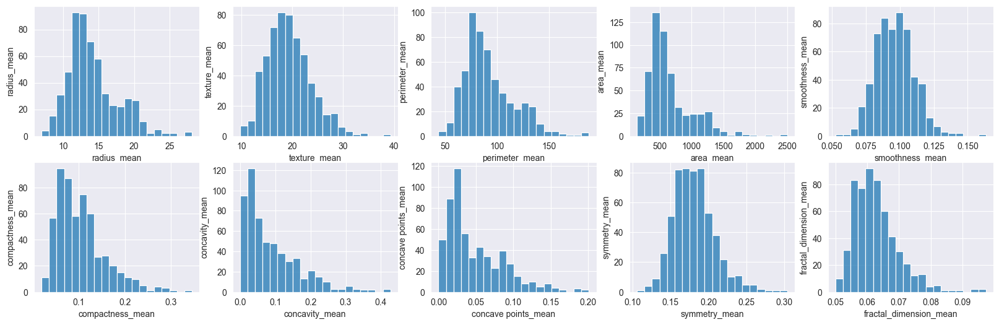

In [110]:
hist_plotting(df, num_columns_mean)

Рассмотрение средних отклонений

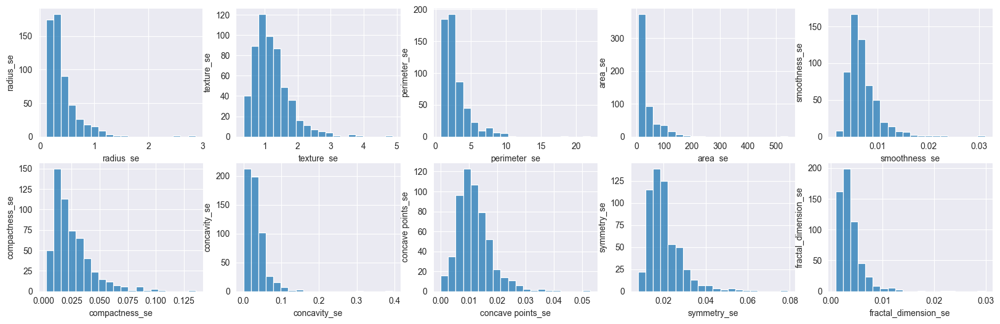

In [12]:
hist_plotting(df, num_columns_se)

Рассмотрение Worst

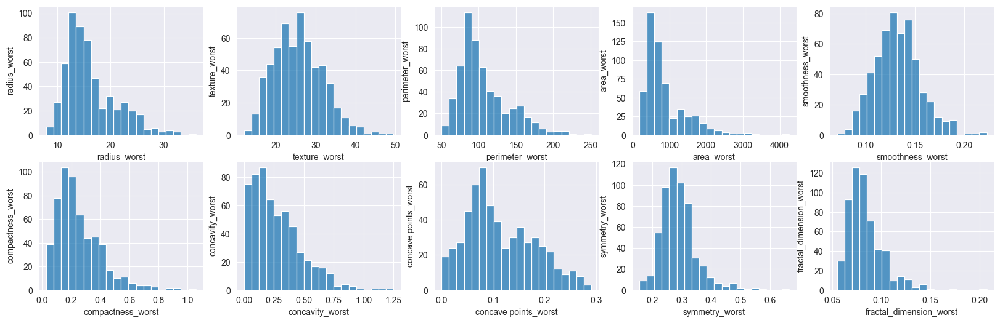

In [13]:
hist_plotting(df, num_columns_worst)

### Определение и удаление выбросов

### Violine plot

In [14]:
def violin_plotting(data, name_columns, width=5, hue='diagnosis'):
    height = int(np.ceil(len(name_columns) / width))
    fig, ax = plt.subplots(nrows=height, ncols=width, figsize=(20, 3 * height))

    for idx, column_name in enumerate(name_columns):
        subplot_ax = ax[idx // width, idx % width]
        sns.violinplot(y=column_name, x=hue, data=data, ax=subplot_ax)
        subplot_ax.set_ylabel(column_name)

    plt.tight_layout()
    plt.show()

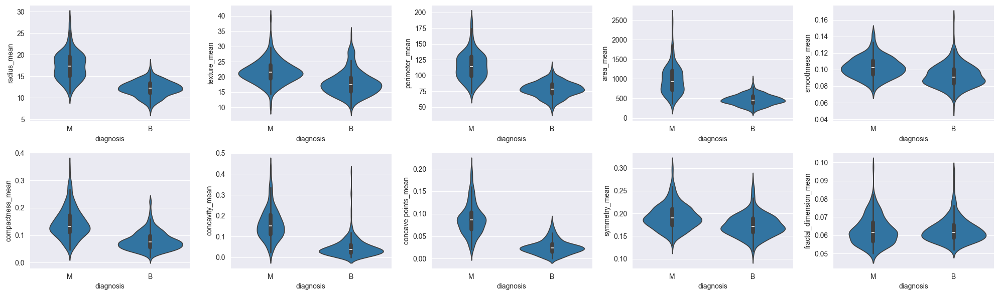

In [15]:
violin_plotting(df, num_columns_mean)

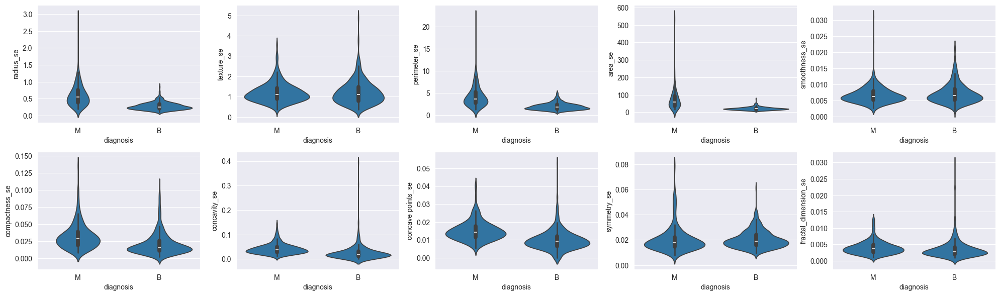

In [16]:
violin_plotting(df, num_columns_se)

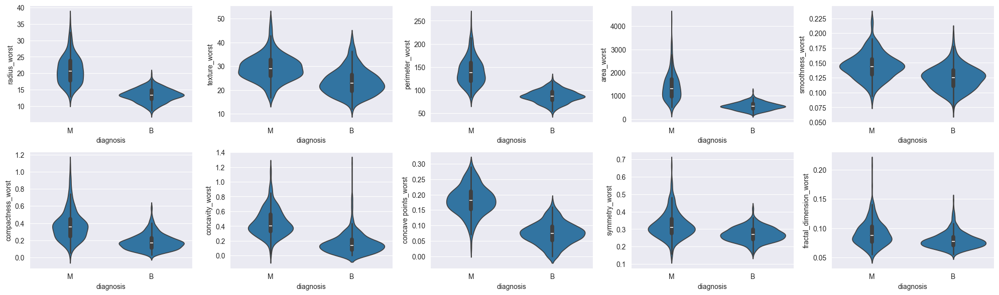

In [17]:
violin_plotting(df, num_columns_worst)

### Boxplot

In [18]:
def box_plotting(data, name_columns, width=5, hue='diagnosis'):
    height = int(np.ceil(len(name_columns) / width))
    fig, ax = plt.subplots(nrows=height, ncols=width, figsize=(20, 3 * height))

    for idx, column_name in enumerate(name_columns):
        subplot_ax = ax[idx // width, idx % width]
        sns.boxplot(x=hue, y=column_name, data=data, ax=subplot_ax)
        subplot_ax.set_ylabel(column_name)

    plt.tight_layout()
    plt.show()

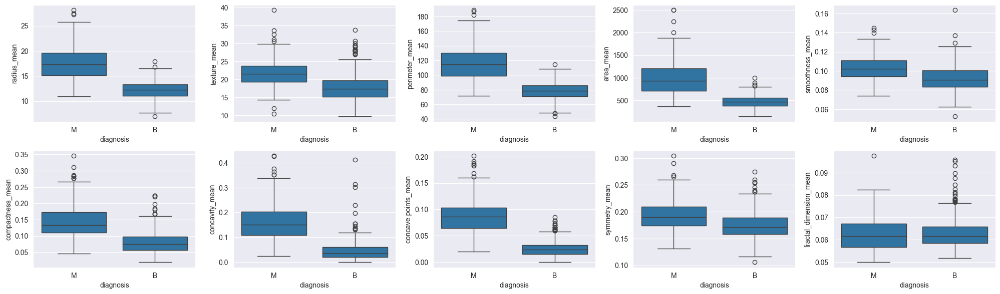

In [19]:
box_plotting(df,num_columns_mean)

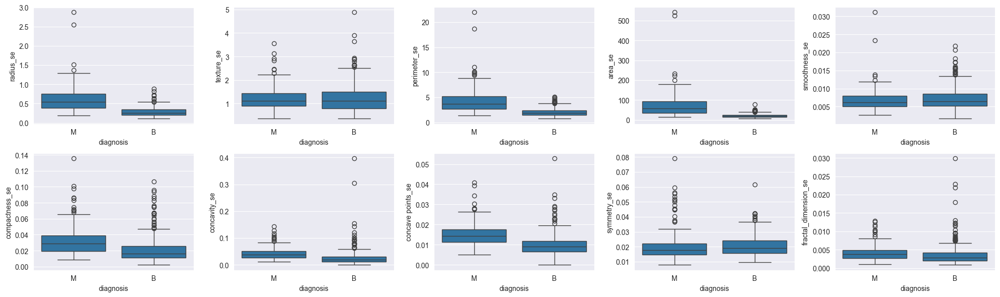

In [20]:
box_plotting(df,num_columns_se)

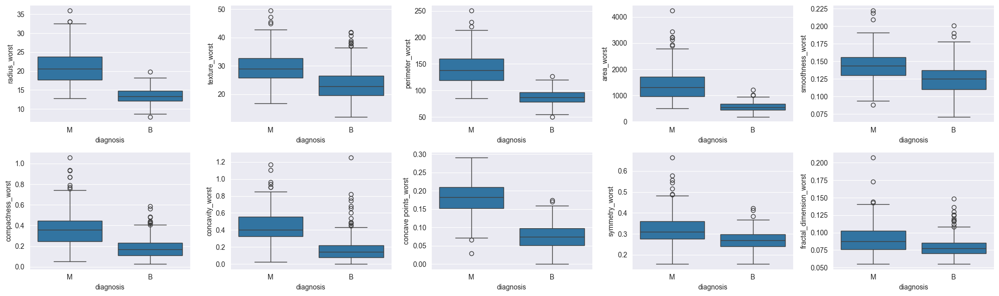

In [21]:
box_plotting(df,num_columns_worst)

In [22]:
df_anom = df.copy()
for col in num_columns:
  n1 = df_anom.shape[0]
  Q1 = df_anom[col].quantile(0.25)
  Q3 = df_anom[col].quantile(0.75)
  IQR = Q3 - Q1
  lower = Q1 - 1.5*IQR
  upper = Q3 + 1.5*IQR

  df_anom = df_anom.drop(index=df_anom[(df_anom[col]>=upper) | (df_anom[col]<=lower)].index)
  print(f'Из колонки {col} удалено {n1-df_anom.shape[0]} элементов')

Из колонки radius_mean удалено 14 элементов
Из колонки texture_mean удалено 7 элементов
Из колонки perimeter_mean удалено 2 элементов
Из колонки area_mean удалено 33 элементов
Из колонки smoothness_mean удалено 6 элементов
Из колонки compactness_mean удалено 15 элементов
Из колонки concavity_mean удалено 13 элементов
Из колонки concave points_mean удалено 3 элементов
Из колонки symmetry_mean удалено 8 элементов
Из колонки fractal_dimension_mean удалено 10 элементов
Из колонки radius_se удалено 23 элементов
Из колонки texture_se удалено 14 элементов
Из колонки perimeter_se удалено 10 элементов
Из колонки area_se удалено 23 элементов
Из колонки smoothness_se удалено 15 элементов
Из колонки compactness_se удалено 14 элементов
Из колонки concavity_se удалено 6 элементов
Из колонки concave points_se удалено 3 элементов
Из колонки symmetry_se удалено 15 элементов
Из колонки fractal_dimension_se удалено 7 элементов
Из колонки radius_worst удалено 6 элементов
Из колонки texture_worst удалено 0

In [23]:
df_anom.shape, df.shape

((277, 31), (569, 31))

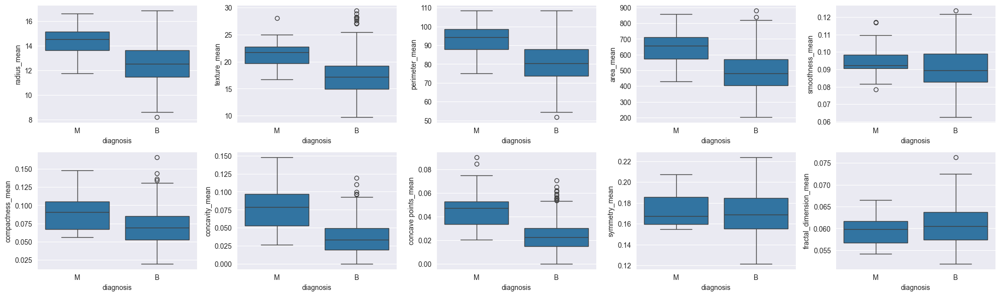

In [24]:
box_plotting(df_anom,num_columns_mean)

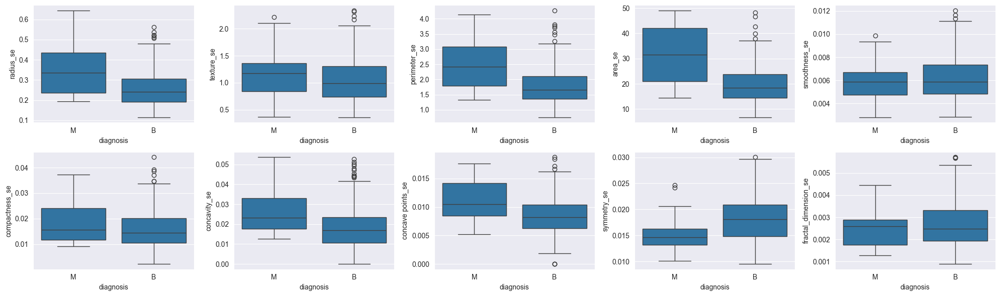

In [25]:
box_plotting(df_anom,num_columns_se)

### Рассмотрение зависимостей в данных

In [112]:
def plotting_pair_plot(data, name_cols, name_target):
  _ = plt.figure(figsize=(15,15))
  num_columns_pair = name_cols + [name_target]
  sns.pairplot(data = data[num_columns_pair],
              hue =name_target,
              palette = 'bwr',)

<Figure size 1500x1500 with 0 Axes>

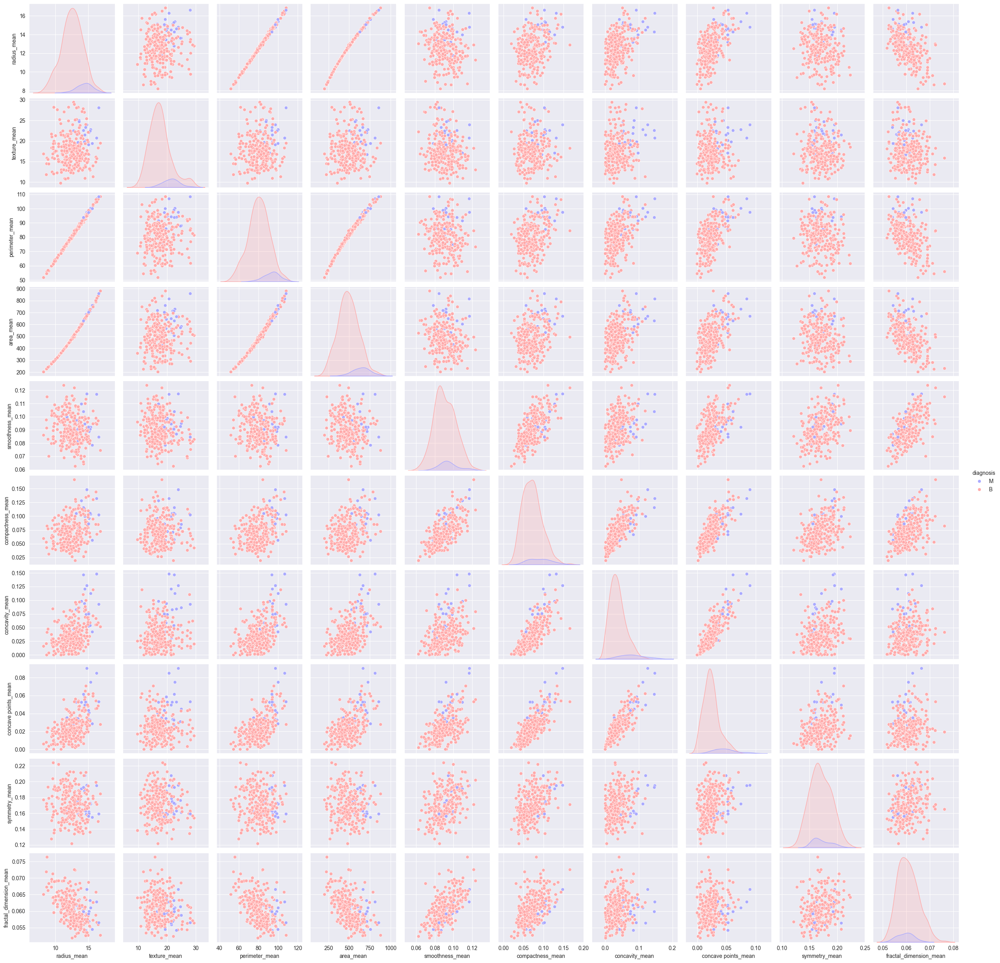

In [113]:
plotting_pair_plot(df_anom, num_columns_mean, 'diagnosis')

<Figure size 1500x1500 with 0 Axes>

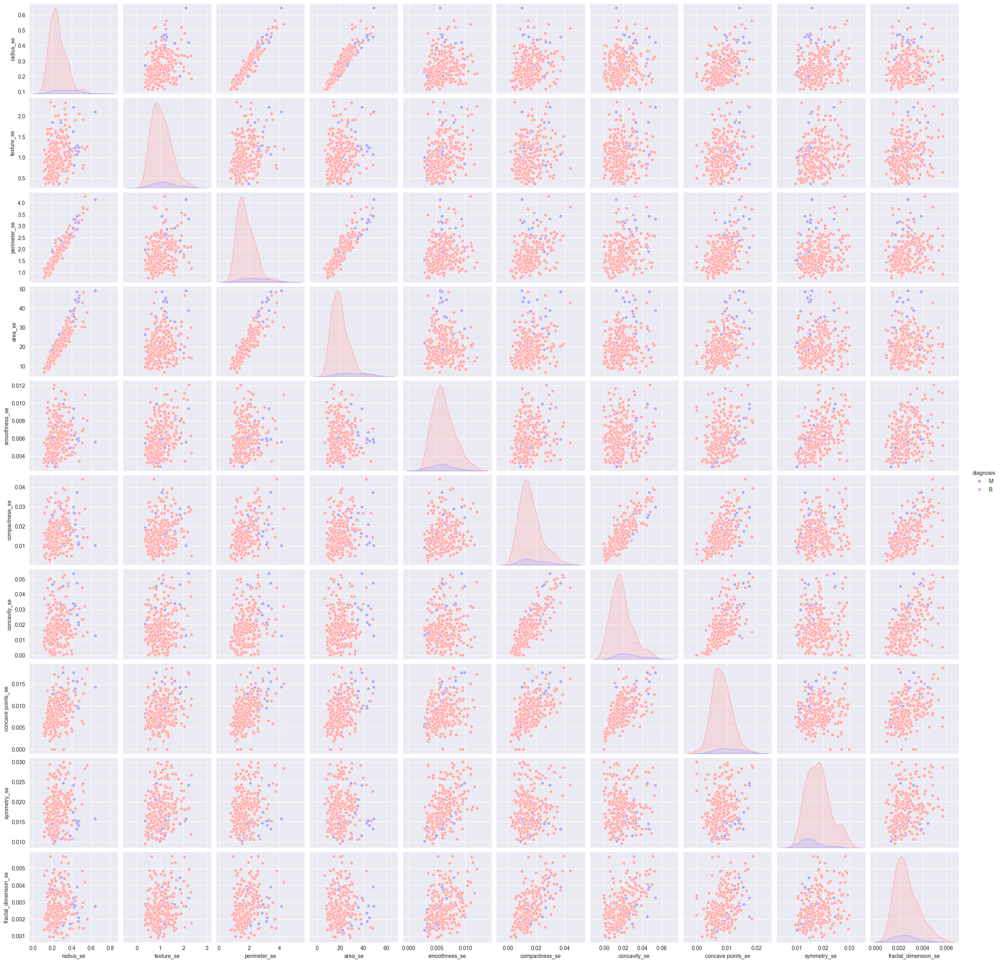

In [28]:
plotting_pair_plot(df_anom, num_columns_se, 'diagnosis')

<Figure size 1500x1500 with 0 Axes>

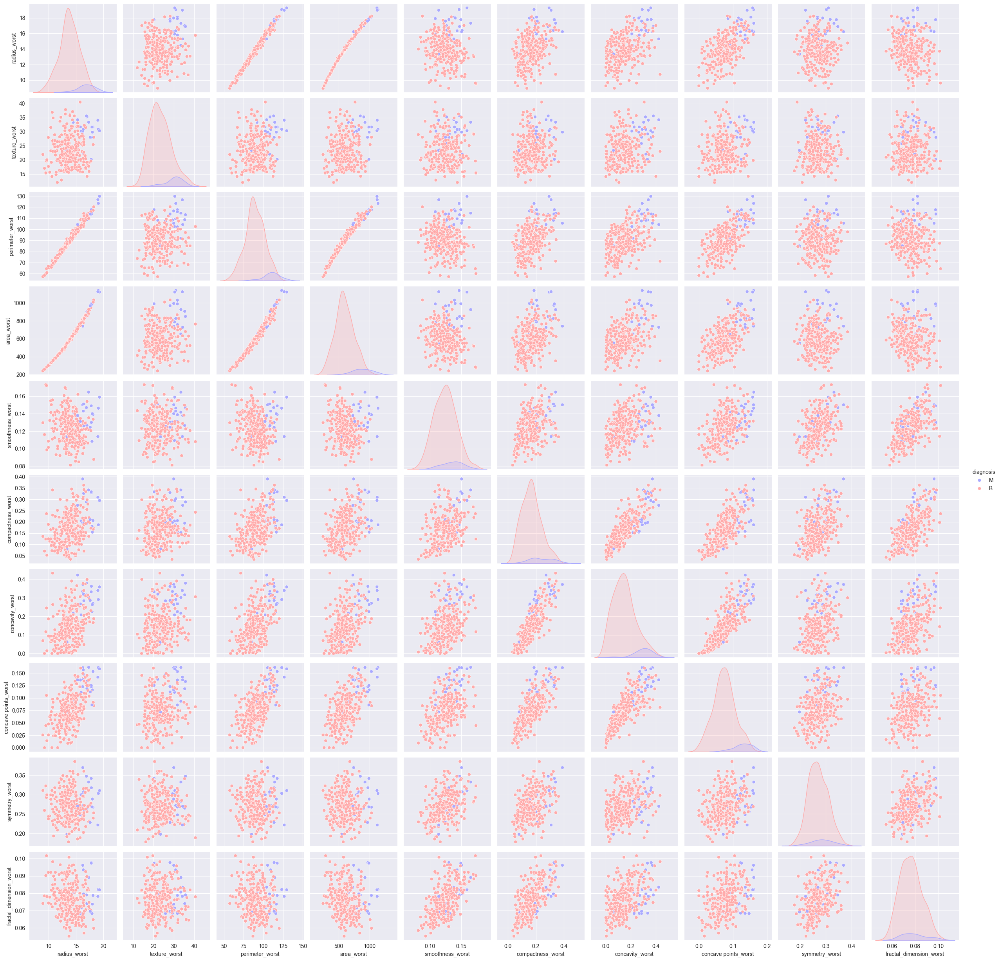

In [29]:
plotting_pair_plot(df_anom, num_columns_worst, 'diagnosis')

In [30]:
num_cols_radius = [num_columns_mean[0], num_columns_se[0], num_columns_worst[0]]
num_cols_radius

['radius_mean', 'radius_se', 'radius_worst']

<Figure size 1500x1500 with 0 Axes>

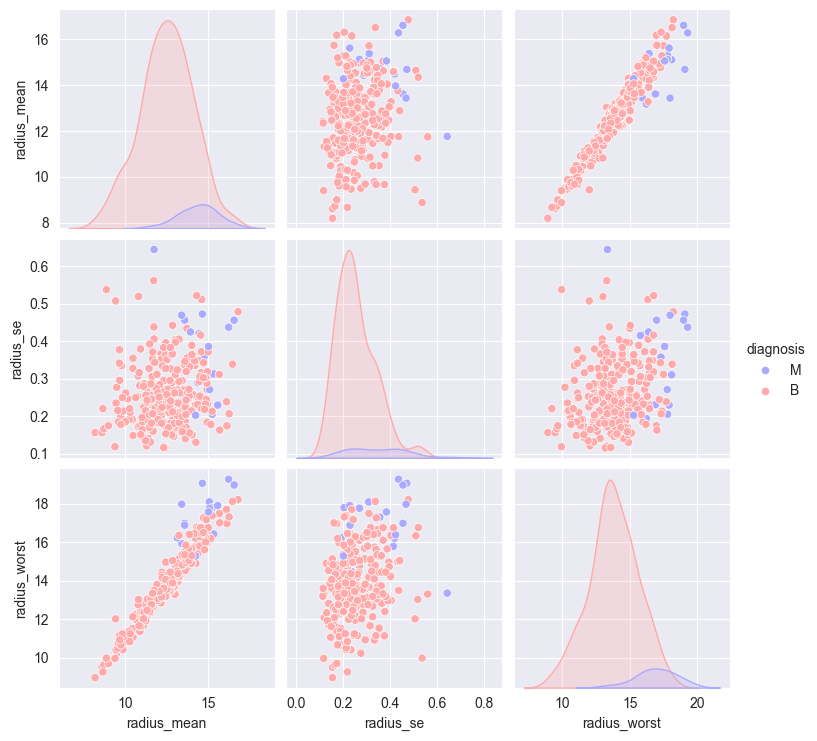

<Figure size 1500x1500 with 0 Axes>

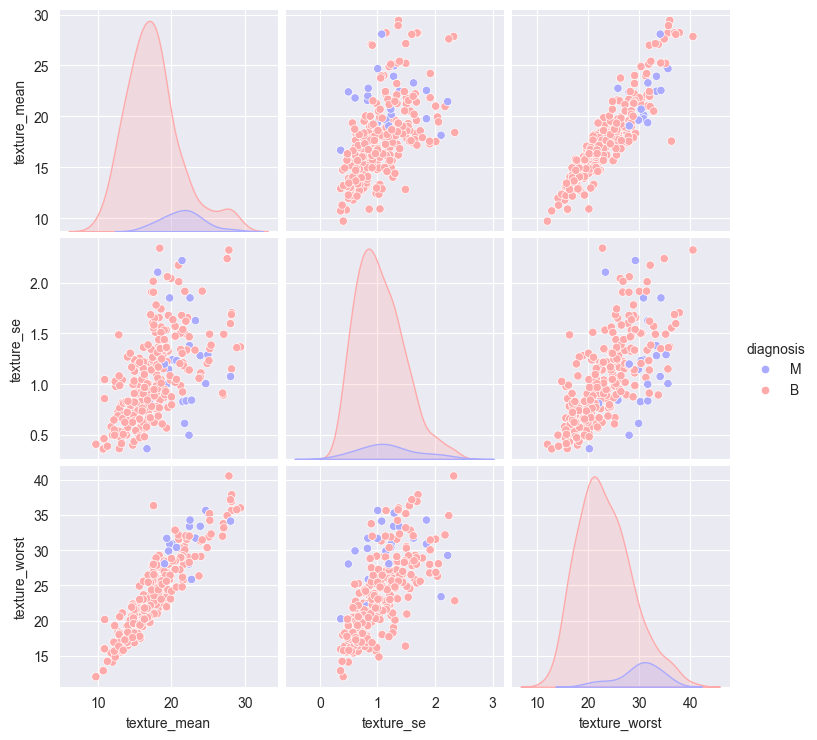

<Figure size 1500x1500 with 0 Axes>

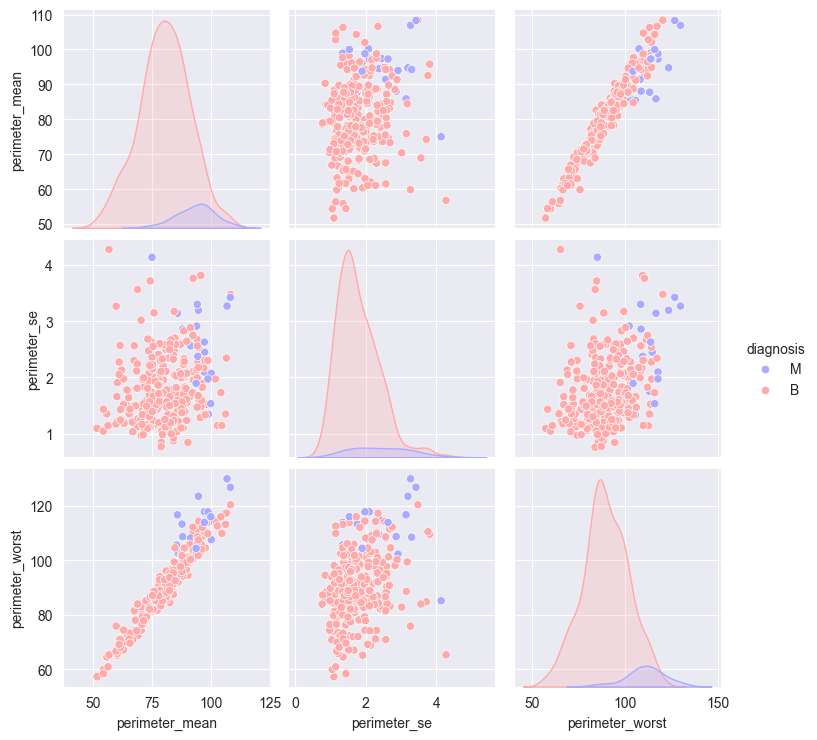

<Figure size 1500x1500 with 0 Axes>

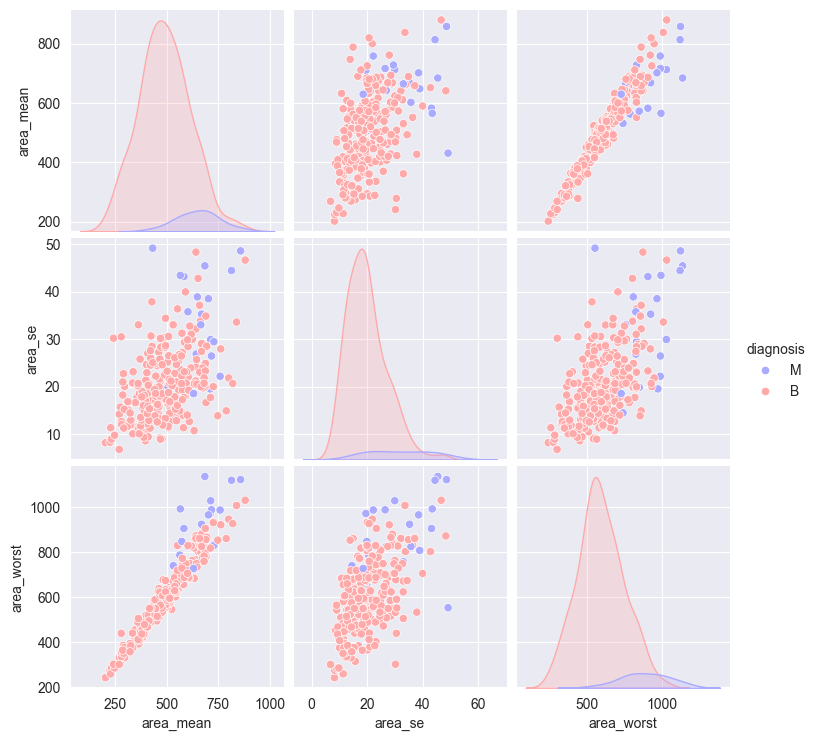

<Figure size 1500x1500 with 0 Axes>

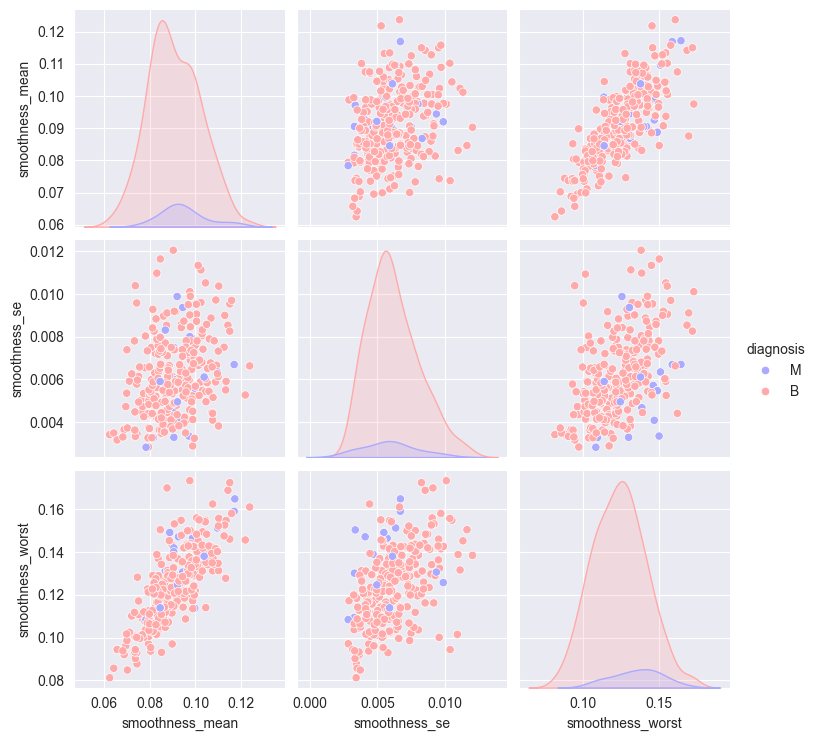

<Figure size 1500x1500 with 0 Axes>

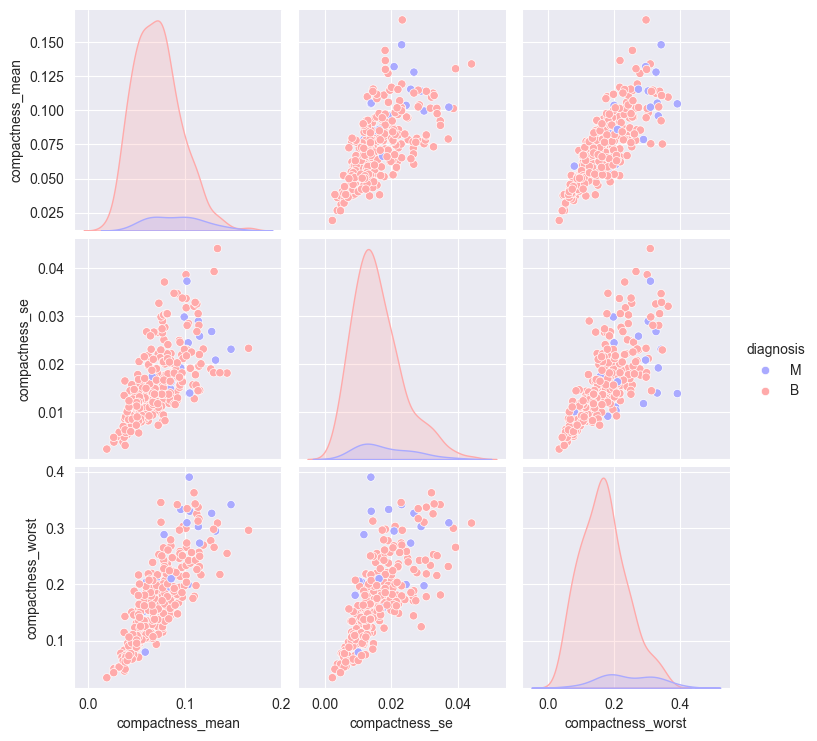

<Figure size 1500x1500 with 0 Axes>

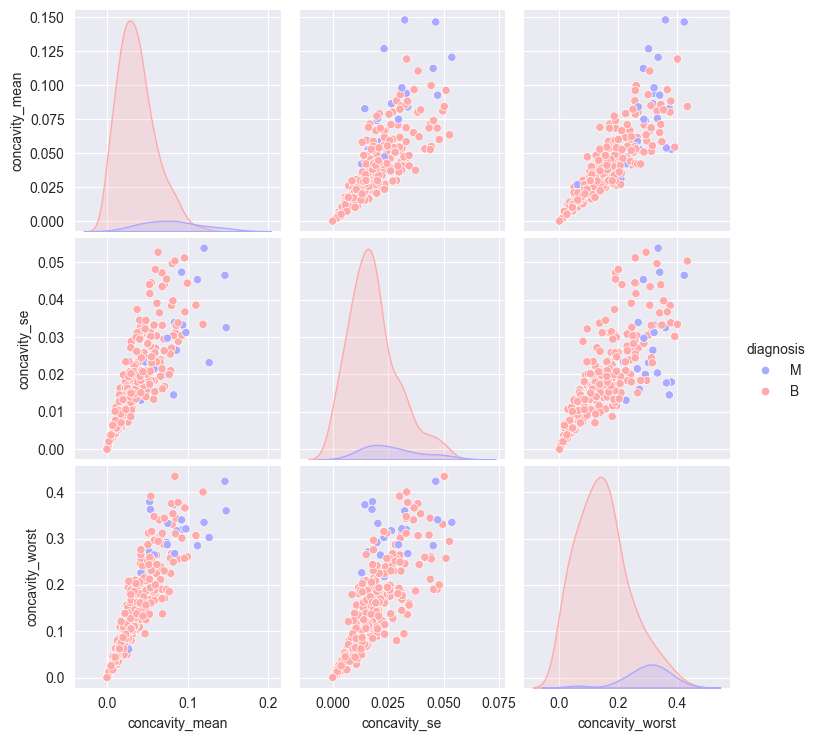

<Figure size 1500x1500 with 0 Axes>

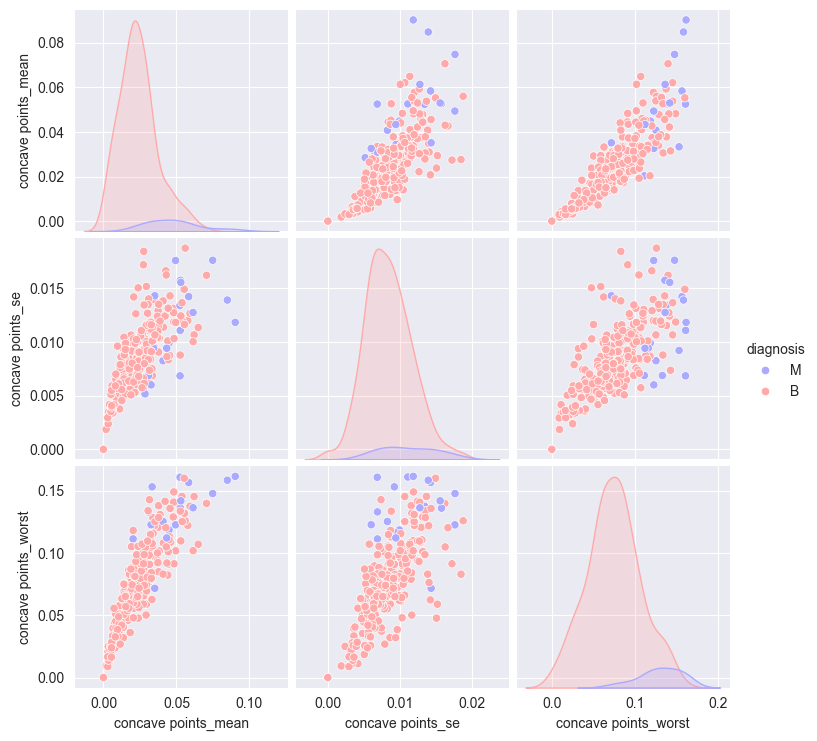

<Figure size 1500x1500 with 0 Axes>

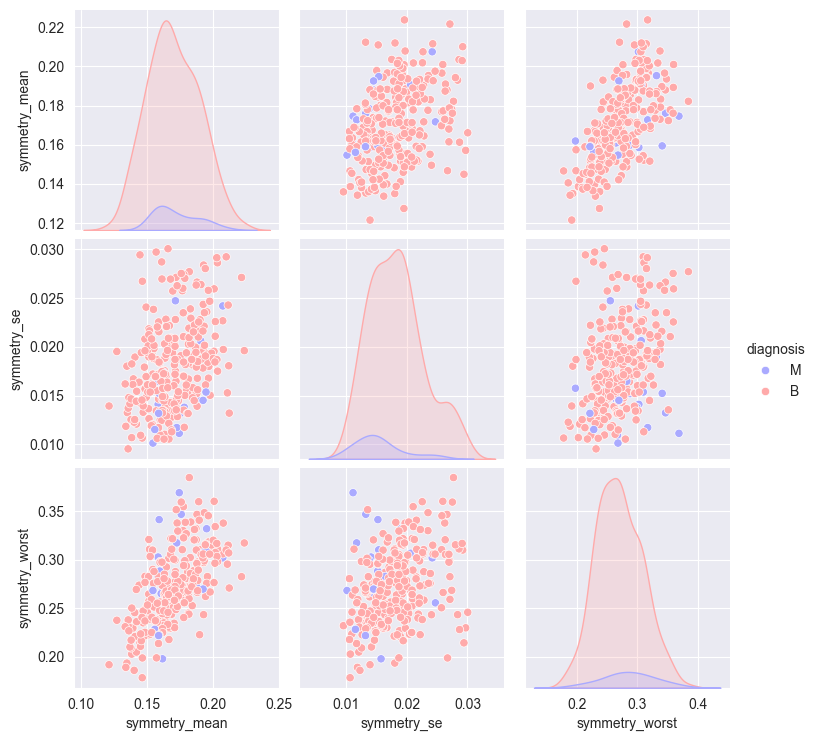

<Figure size 1500x1500 with 0 Axes>

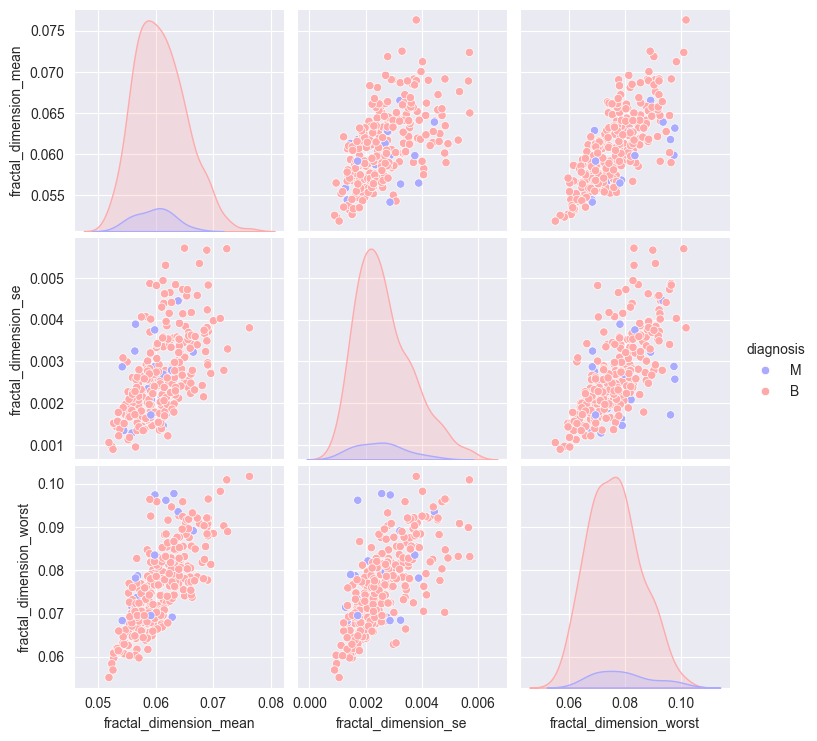

In [31]:
for i in range(len(num_columns_mean)):
  num_cols_param = [num_columns_mean[i], num_columns_se[i], num_columns_worst[i]]
  plotting_pair_plot(df_anom, num_cols_param, 'diagnosis')

## Распределение категориальной переменной

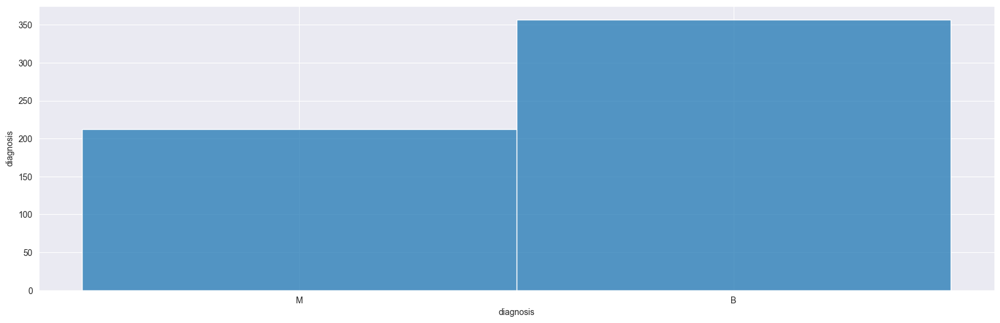

In [32]:
hist_plotting(df, cat_columns, width=1)

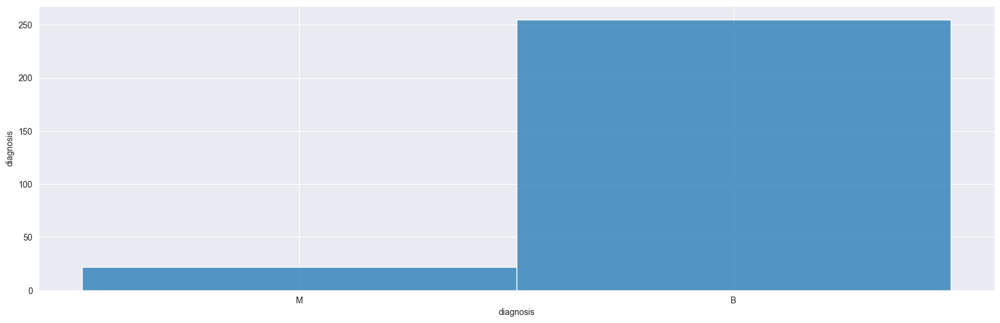

In [33]:
hist_plotting(df_anom, cat_columns, width=1)

### Нормализация

In [34]:
df_norm = df_anom.copy()
num_scaler = StandardScaler()
df_norm[num_columns] = num_scaler.fit_transform(df_anom[num_columns])
df_norm

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
16,M,1.216490,0.594852,1.213768,1.404582,0.670409,-0.047675,1.256834,1.749874,-0.610956,...,2.563845,1.274503,2.415719,3.046040,1.215403,0.182853,1.340116,2.363877,0.811767,0.601063
19,B,0.530678,-0.914388,0.558356,0.496975,0.592536,0.325166,0.985898,1.436665,0.945765,...,0.540794,-0.838132,0.640337,0.554010,1.079733,0.047522,0.807310,1.438978,0.676159,-0.423107
20,B,0.253947,-0.561273,0.393603,0.141458,1.451802,2.159674,0.209041,0.341745,1.372692,...,0.229162,-0.614506,0.369910,0.082813,0.356160,1.432596,0.298907,-0.173689,1.215984,0.565747
21,B,-1.897337,-1.416596,-1.883234,-1.748238,1.000488,-0.331821,-0.388427,-0.335781,0.581315,...,-1.952260,-1.492649,-1.949323,-1.759935,0.423995,-0.815560,-0.721255,-0.477955,-0.698180,0.126970
37,B,0.223867,0.147573,0.121715,0.170636,-0.111869,-1.425863,-0.534459,0.219214,-1.230521,...,-0.383884,-0.192706,-0.501301,-0.411156,-1.576571,-1.763017,-1.131434,-0.827745,-1.905616,-1.589611
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552,B,0.067454,3.027421,0.008278,0.048547,-0.737514,-1.238038,-0.743869,-0.713860,-0.855658,...,-0.092687,2.205372,-0.228626,-0.126219,-0.084767,-0.931558,-0.743015,-0.399871,-0.810317,-1.252502
554,B,0.133629,2.894022,0.111812,0.097690,-0.872908,-0.599914,0.812069,-0.160830,-0.715085,...,-0.082470,2.158101,-0.173192,-0.120380,-0.124338,-0.163761,0.857133,-0.401312,-0.901592,-0.441300
555,B,-1.424488,2.551370,-1.403379,-1.383506,-0.070277,0.136137,0.739424,0.097993,-0.574511,...,-1.640628,2.007199,-1.616720,-1.510615,0.763170,-0.039477,0.410755,0.357624,-1.282339,0.672766
560,B,0.837488,2.431049,0.911270,0.758815,0.725275,1.581750,0.169753,1.124112,-0.866071,...,0.637859,1.690849,0.677792,0.527735,-0.045197,0.725559,-0.274572,0.747465,-1.219750,0.713433


In [35]:
cat_encoder = LabelEncoder()
df_norm['diagnosis'] = cat_encoder.fit_transform(df_norm['diagnosis'])

In [36]:
df_norm.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
16,1,1.216490,0.594852,1.213768,1.404582,0.670409,-0.047675,1.256834,1.749874,-0.610956,...,2.563845,1.274503,2.415719,3.046040,1.215403,0.182853,1.340116,2.363877,0.811767,0.601063
19,0,0.530678,-0.914388,0.558356,0.496975,0.592536,0.325166,0.985898,1.436665,0.945765,...,0.540794,-0.838132,0.640337,0.554010,1.079733,0.047522,0.807310,1.438978,0.676159,-0.423107
20,0,0.253947,-0.561273,0.393603,0.141458,1.451802,2.159674,0.209041,0.341745,1.372692,...,0.229162,-0.614506,0.369910,0.082813,0.356160,1.432596,0.298907,-0.173689,1.215984,0.565747
21,0,-1.897337,-1.416596,-1.883234,-1.748238,1.000488,-0.331821,-0.388427,-0.335781,0.581315,...,-1.952260,-1.492649,-1.949323,-1.759935,0.423995,-0.815560,-0.721255,-0.477955,-0.698180,0.126970
37,0,0.223867,0.147573,0.121715,0.170636,-0.111869,-1.425863,-0.534459,0.219214,-1.230521,...,-0.383884,-0.192706,-0.501301,-0.411156,-1.576571,-1.763017,-1.131434,-0.827745,-1.905616,-1.589611


## Корреляция признаков

In [37]:
def corr_matrix_plotting(corr_matrix):
  plt.figure(figsize=(20, 20))
  sns.heatmap(corr_matrix, annot = True, fmt='.2f',
              vmin=-1, vmax=1, center= 0, cmap= 'coolwarm',
              linewidths=1, linecolor='black', square=True)
  plt.title("Матрица корреляции")
  plt.xlabel("Признаки")
  plt.ylabel("Признаки")
  plt.show()

In [38]:
def check_correlation(corr_matrix, threshold):
  high_corr_pairs = []

  for i in range(len(corr_matrix.columns)):
      for j in range(i + 1, len(corr_matrix.columns)):
          if abs(corr_matrix.iloc[i, j]) >= threshold:
              high_corr_pairs.append((corr_matrix.index[i], corr_matrix.columns[j]))

  print(f"Пары признаков с корреляцией >= {threshold}:")
  for pair in high_corr_pairs:
      print(pair)

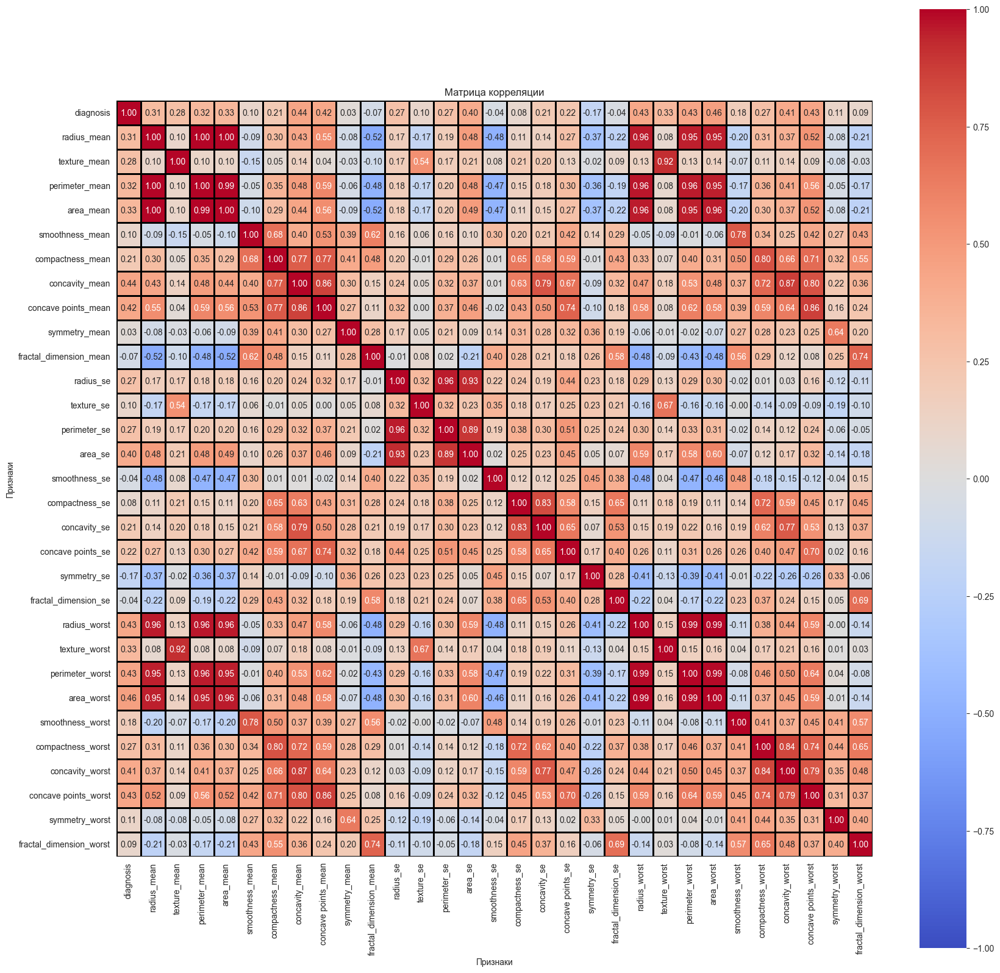

In [39]:
corr_matrix = df_norm.corr()

corr_matrix_plotting(corr_matrix)

In [40]:
check_correlation(corr_matrix, 0.7)

Пары признаков с корреляцией >= 0.7:
('radius_mean', 'perimeter_mean')
('radius_mean', 'area_mean')
('radius_mean', 'radius_worst')
('radius_mean', 'perimeter_worst')
('radius_mean', 'area_worst')
('texture_mean', 'texture_worst')
('perimeter_mean', 'area_mean')
('perimeter_mean', 'radius_worst')
('perimeter_mean', 'perimeter_worst')
('perimeter_mean', 'area_worst')
('area_mean', 'radius_worst')
('area_mean', 'perimeter_worst')
('area_mean', 'area_worst')
('smoothness_mean', 'smoothness_worst')
('compactness_mean', 'concavity_mean')
('compactness_mean', 'concave points_mean')
('compactness_mean', 'compactness_worst')
('compactness_mean', 'concave points_worst')
('concavity_mean', 'concave points_mean')
('concavity_mean', 'concavity_se')
('concavity_mean', 'compactness_worst')
('concavity_mean', 'concavity_worst')
('concavity_mean', 'concave points_worst')
('concave points_mean', 'concave points_se')
('concave points_mean', 'concave points_worst')
('fractal_dimension_mean', 'fractal_dim

In [41]:
cols_to_del = ['radius_worst', 'concavity_worst', 'concavity_se', 'concave points_se', 'concavity_mean', 'compactness_mean',
                                     'perimeter_mean', 'area_mean', 'perimeter_se', 'area_se', 'perimeter_worst', 'area_worst',
                                     'texture_worst', 'smoothness_worst','compactness_worst', 'concave points_worst', 'fractal_dimension_worst']

In [42]:
len(cols_to_del)

17

In [43]:
df_norm_sort = df_norm.drop(columns=cols_to_del)

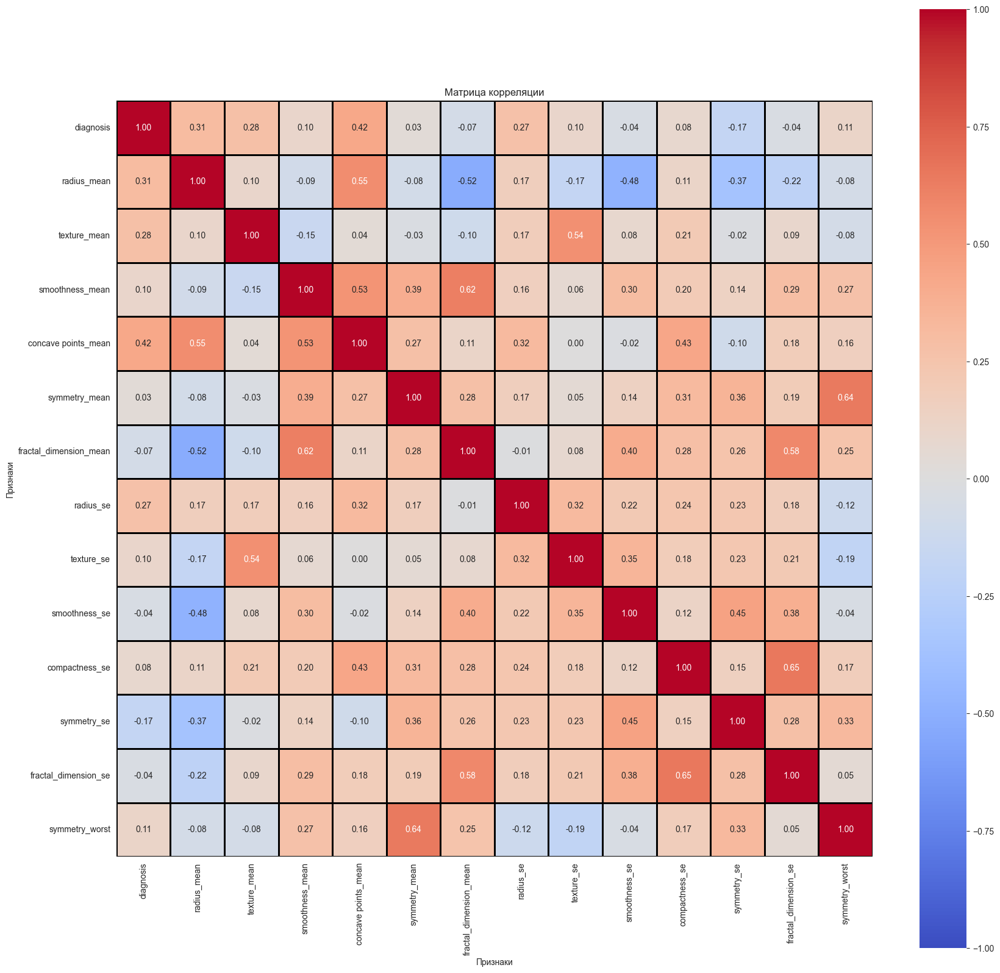

In [44]:
corr_matrix_sort = df_norm_sort.corr()
corr_matrix_plotting(corr_matrix_sort)

In [45]:
check_correlation(corr_matrix_sort, 0.7)

Пары признаков с корреляцией >= 0.7:


## Промежуточные выводы

В искомых данных не имелось дубликатов или пропущенных значений. При рассмотрении данных на выбросы было удалено больше половины исходных данных, что может ухудшить модель. Также были рассмотрены зависимости между переменными и было удалено 17 признаков, которые имели корреляцию выше 0.7. Также была произведена нормализация данных и кодирование предсказываемой категориальной переменной. В результате очистки данных наблюдается дисбаланс классов для предсказываемой переменной, что также может ухудшить качество модели. В дальнейшем будет рассмотрена модель со сбалансированными классами при помощи oversampling.

# Обучение модели

## Разбиение данных

In [46]:
y = df_norm_sort['diagnosis']
X = df_norm_sort.drop(['diagnosis'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)
print(f'Размер тестового множества: {X_test.shape[0]}')
print(f'Размер тренировочного множества: {X_train.shape[0]}')

Размер тестового множества: 56
Размер тренировочного множества: 221


## Построение модели

In [56]:
def print_best_params_score(model,x_test, y_test):
    # Лучшие параметры и оценка модели
    y_pred = model.predict(x_test)
    y_scores = model.predict_proba(x_test)[:, 1]
    # Лучшие параметры и оценку
    print("Лучшие параметры:", model.get_params())
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Precision:", precision_score(y_test, y_pred))
    print("Recall:", recall_score(y_test, y_pred))
    print("F1-score:", f1_score(y_test, y_pred))
    print("ROC-AUC:", roc_auc_score(y_test, y_scores))

In [58]:
def visualize_roc_auc(model, x_test, y_test):
    y_scores = model.predict_proba(x_test)[:, 1]
    # ROC-кривая и ROC-AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_scores)
    roc_auc = auc(fpr, tpr)
    # ROC-кривая
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

In [60]:
def visualize_confusion_matrix(model, x_test, y_test):
    # Предсказания на тестовых данных
    ConfusionMatrixDisplay.from_estimator(model, x_test, y_test, cmap='RdYlGn')
    plt.show()

In [62]:
model = MLPClassifier(max_iter = 2000)
parameters = {
    'hidden_layer_sizes': [(10,), (12,), (14,), (16,), (20,), (25,), (50,), (100,)],
    'activation': ['relu', 'tanh', 'logistic'],
    'solver': ['sgd', 'adam', 'lbfgs'],
    'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1],
    'learning_rate': ['constant', 'adaptive'],
    'learning_rate_init': [0.001, 0.01, 0.1],
    'momentum': [0.9, 0.5],
    'shuffle': [True, False],
    'early_stopping': [True, False]
}
grid_search = GridSearchCV(model, parameters, scoring='f1', cv=5, n_jobs=-1)

In [63]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=MLPClassifier(max_iter=2000), n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh', 'logistic'],
                         'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1],
                         'early_stopping': [True, False],
                         'hidden_layer_sizes': [(10,), (12,), (14,), (16,),
                                                (20,), (25,), (50,), (100,)],
                         'learning_rate': ['constant', 'adaptive'],
                         'learning_rate_init': [0.001, 0.01, 0.1],
                         'momentum': [0.9, 0.5], 'shuffle': [True, False],
                         'solver': ['sgd', 'adam', 'lbfgs']},
             scoring='f1')

In [64]:
best_mlpc_model = grid_search.best_estimator_

In [65]:
joblib.dump(best_mlpc_model , 'best_mlpc_model.pkl')

['best_mlpc_model.pkl']

### Оценка на тренировочных данных

In [81]:
print_best_params_score(best_mlpc_model, X_train, y_train)

Лучшие параметры: {'activation': 'tanh', 'alpha': 0.1, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': True, 'epsilon': 1e-08, 'hidden_layer_sizes': (16,), 'learning_rate': 'adaptive', 'learning_rate_init': 0.1, 'max_fun': 15000, 'max_iter': 2000, 'momentum': 0.5, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': None, 'shuffle': True, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}
Accuracy: 0.9411764705882353
Precision: 0.6666666666666666
Recall: 0.631578947368421
F1-score: 0.6486486486486486
ROC-AUC: 0.9458051068264721


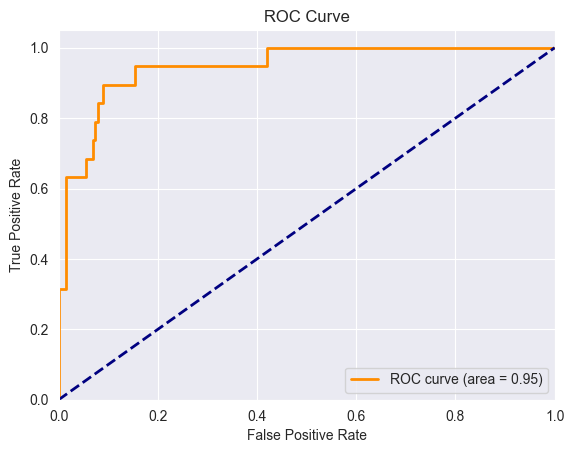

In [82]:
visualize_roc_auc(best_mlpc_model, X_train, y_train)

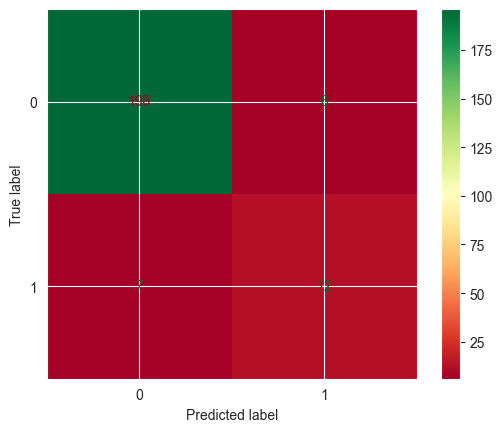

In [83]:
visualize_confusion_matrix(best_mlpc_model, X_train, y_train)

### Оценка на тестовых данных

In [66]:
print_best_params_score(best_mlpc_model, X_test, y_test)

Лучшие параметры: {'activation': 'tanh', 'alpha': 0.1, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': True, 'epsilon': 1e-08, 'hidden_layer_sizes': (16,), 'learning_rate': 'adaptive', 'learning_rate_init': 0.1, 'max_fun': 15000, 'max_iter': 2000, 'momentum': 0.5, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': None, 'shuffle': True, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}
Accuracy: 0.9642857142857143
Precision: 0.6
Recall: 1.0
F1-score: 0.7499999999999999
ROC-AUC: 0.9811320754716981


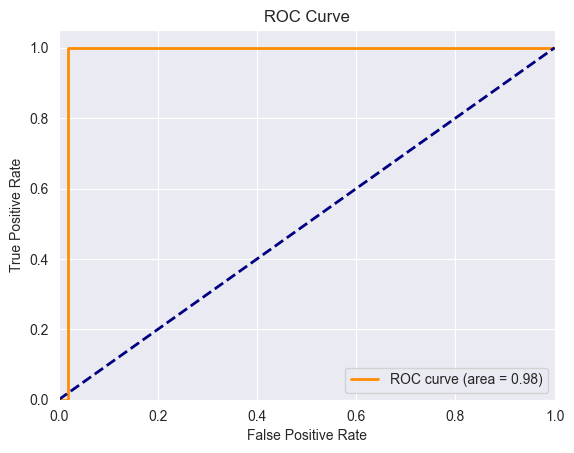

In [67]:
visualize_roc_auc(best_mlpc_model, X_test, y_test)

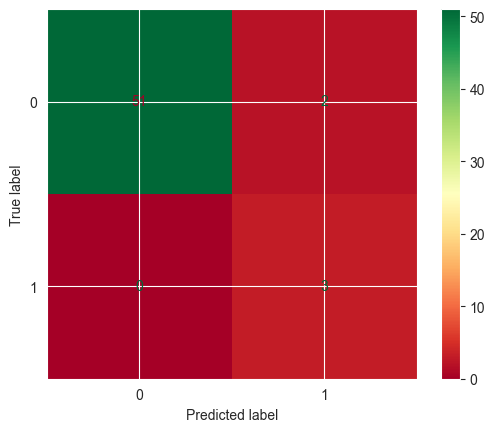

In [68]:
visualize_confusion_matrix(best_mlpc_model, X_test, y_test)

## Промежуточные выводы

В результате обучения получилась модель с accuracy = 0.964 на тестовой выборке, но оценить качество модели крайне сложно, ведь в тестовой выборке имеется только 3 примера класса 1. Для повышения качества модели можно применить oversampling для сбалансирования классов. При этом тестирование самой модели проводить используя все исходные данные, учитывая выбросы.

## Улучшение качества модели

In [73]:
smote = SMOTE(random_state = 42)
X_train_resampled, Y_train_resampled = smote.fit_resample(X_train, y_train)

In [71]:
model = MLPClassifier(max_iter = 2000)
parameters = {
    'hidden_layer_sizes': [(10,), (12,), (14,), (16,), (20,), (25,), (50,), (100,)],
    'activation': ['relu', 'tanh', 'logistic'],
    'solver': ['sgd', 'adam', 'lbfgs'],
    'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1],
    'learning_rate': ['constant', 'adaptive'],
    'learning_rate_init': [0.001, 0.01, 0.1],
    'momentum': [0.9, 0.5],
    'shuffle': [True, False],
    'early_stopping': [True, False]
}
grid_search_resampled = GridSearchCV(model, parameters, scoring='f1', cv=5, n_jobs=-1)

In [74]:
grid_search_resampled.fit(X_train_resampled, Y_train_resampled)

GridSearchCV(cv=5, estimator=MLPClassifier(max_iter=2000), n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh', 'logistic'],
                         'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1],
                         'early_stopping': [True, False],
                         'hidden_layer_sizes': [(10,), (12,), (14,), (16,),
                                                (20,), (25,), (50,), (100,)],
                         'learning_rate': ['constant', 'adaptive'],
                         'learning_rate_init': [0.001, 0.01, 0.1],
                         'momentum': [0.9, 0.5], 'shuffle': [True, False],
                         'solver': ['sgd', 'adam', 'lbfgs']},
             scoring='f1')

In [86]:
best_mlpc_resampled_model = grid_search_resampled.best_estimator_

In [87]:
joblib.dump(best_mlpc_resampled_model , 'best_mlpc_resampled_model.pkl')

['best_mlpc_resampled_model.pkl']

### Оценка на тренировочных данных

In [88]:
print_best_params_score(best_mlpc_resampled_model, X_train, y_train)

Лучшие параметры: {'activation': 'relu', 'alpha': 0.0001, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': False, 'epsilon': 1e-08, 'hidden_layer_sizes': (14,), 'learning_rate': 'adaptive', 'learning_rate_init': 0.1, 'max_fun': 15000, 'max_iter': 2000, 'momentum': 0.9, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': None, 'shuffle': False, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}
Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1-score: 1.0
ROC-AUC: 1.0


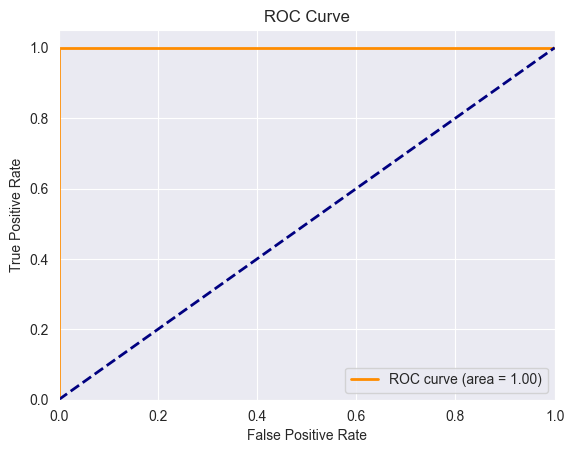

In [89]:
visualize_roc_auc(best_mlpc_resampled_model, X_train, y_train)

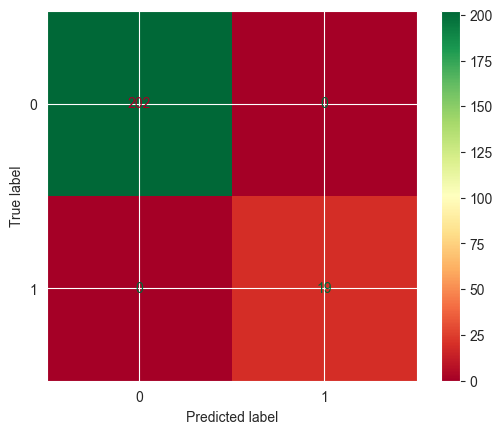

In [90]:
visualize_confusion_matrix(best_mlpc_resampled_model, X_train, y_train)

### Оценка на тестовых данных

In [91]:
print_best_params_score(best_mlpc_resampled_model, X_test, y_test)

Лучшие параметры: {'activation': 'relu', 'alpha': 0.0001, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': False, 'epsilon': 1e-08, 'hidden_layer_sizes': (14,), 'learning_rate': 'adaptive', 'learning_rate_init': 0.1, 'max_fun': 15000, 'max_iter': 2000, 'momentum': 0.9, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': None, 'shuffle': False, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}
Accuracy: 0.9285714285714286
Precision: 0.4
Recall: 0.6666666666666666
F1-score: 0.5
ROC-AUC: 0.7924528301886793


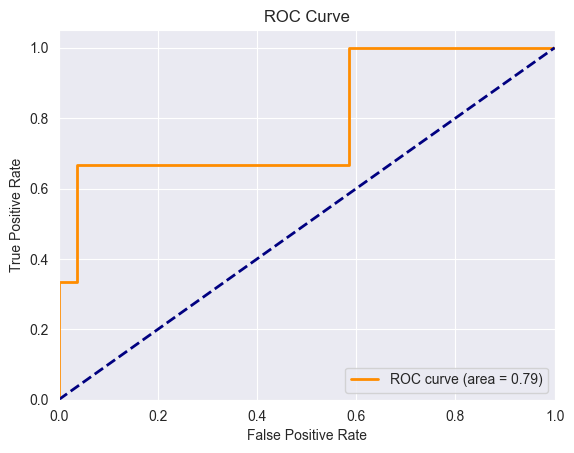

In [92]:
visualize_roc_auc(best_mlpc_resampled_model, X_test, y_test)

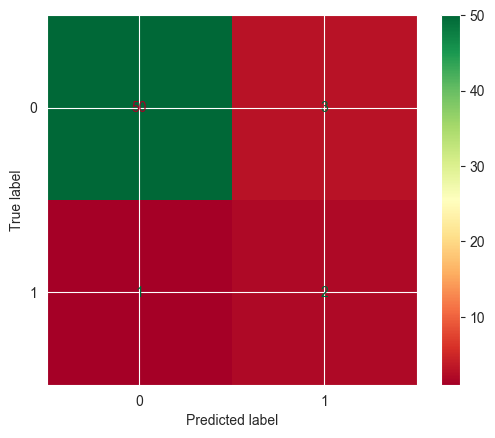

In [93]:
visualize_confusion_matrix(best_mlpc_resampled_model, X_test, y_test)

### Оценка модели на изначальных данных

In [95]:
df_norm_def = df.copy()
num_scaler = StandardScaler()
df_norm_def[num_columns] = num_scaler.fit_transform(df_norm_def[num_columns])
df_norm_def = df_norm_def.drop(columns=cols_to_del)
df_norm_def

,diagnosis,radius_mean,texture_mean,smoothness_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,symmetry_se,fractal_dimension_se,symmetry_worst
0,M,1.097064,-2.073335,1.568466,2.532475,2.217515,2.255747,2.489734,-0.565265,-0.214002,1.316862,1.148757,0.907083,2.750622
1,M,1.829821,-0.353632,-0.826962,0.548144,0.001392,-0.868652,0.499255,-0.876244,-0.605351,-0.692926,-0.805450,-0.099444,-0.243890
2,M,1.579888,0.456187,0.942210,2.037231,0.939685,-0.398008,1.228676,-0.780083,-0.297005,0.814974,0.237036,0.293559,1.152255
3,M,-0.768909,0.253732,3.283553,1.451707,2.867383,4.910919,0.326373,-0.110409,0.689702,2.744280,4.732680,2.047511,6.046041
4,M,1.750297,-1.151816,0.280372,1.428493,-0.009560,-0.562450,1.270543,-0.790244,1.483067,-0.048520,-0.361092,0.499328,-0.868353
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,2.110995,0.721473,1.041842,2.320965,-0.312589,-0.931027,2.782080,0.071025,1.086384,0.191805,-1.138416,0.167980,-1.360158
565,M,1.704854,2.085134,0.102458,1.263669,-0.217664,-1.058611,1.300499,2.260938,-0.424010,-0.069758,-0.189161,-0.490556,-0.531855
566,M,0.702284,2.045574,-0.840484,0.105777,-0.809117,-0.895587,0.184892,-0.257371,-0.379342,0.661277,-0.891416,0.036727,-1.104549
567,M,1.838341,2.336457,1.525767,2.658866,2.137194,1.043695,1.157935,0.686088,-0.173000,2.017716,0.326634,0.904057,1.919083


In [96]:
cat_encoder = LabelEncoder()
df_norm_def['diagnosis'] = cat_encoder.fit_transform(df_norm_def['diagnosis'])

In [97]:
y_def = df_norm_sort['diagnosis']
X_def = df_norm_sort.drop(['diagnosis'], axis=1)

#### Оценка исходной модели

In [101]:
print_best_params_score(best_mlpc_model, X_def, y_def)

Лучшие параметры: {'activation': 'tanh', 'alpha': 0.1, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': True, 'epsilon': 1e-08, 'hidden_layer_sizes': (16,), 'learning_rate': 'adaptive', 'learning_rate_init': 0.1, 'max_fun': 15000, 'max_iter': 2000, 'momentum': 0.5, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': None, 'shuffle': True, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}
Accuracy: 0.9458483754512635
Precision: 0.6521739130434783
Recall: 0.6818181818181818
F1-score: 0.6666666666666666
ROC-AUC: 0.9511586452762923


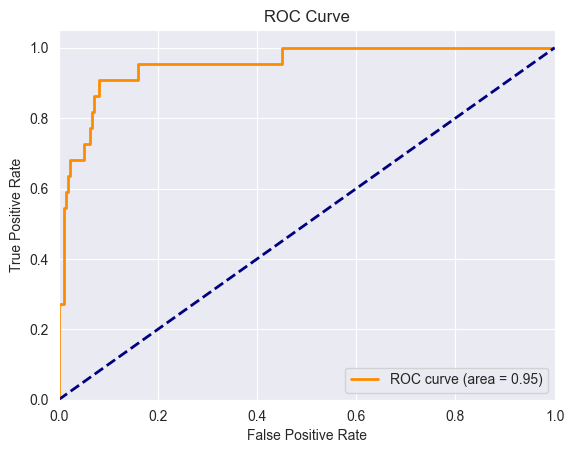

In [102]:
visualize_roc_auc(best_mlpc_model, X_def, y_def)

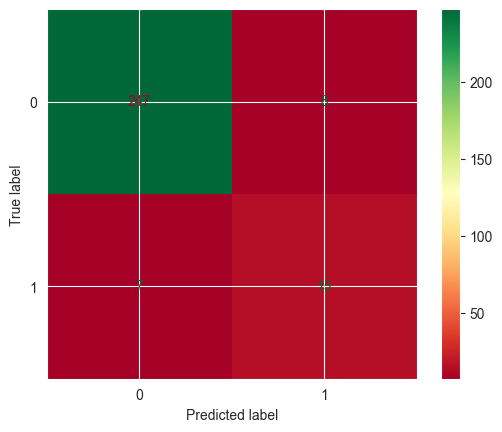

In [103]:
visualize_confusion_matrix(best_mlpc_model, X_def, y_def)

#### Оценка улучшенной модели

In [98]:
print_best_params_score(best_mlpc_resampled_model, X_def, y_def)

Лучшие параметры: {'activation': 'relu', 'alpha': 0.0001, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': False, 'epsilon': 1e-08, 'hidden_layer_sizes': (14,), 'learning_rate': 'adaptive', 'learning_rate_init': 0.1, 'max_fun': 15000, 'max_iter': 2000, 'momentum': 0.9, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': None, 'shuffle': False, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}
Accuracy: 0.9855595667870036
Precision: 0.875
Recall: 0.9545454545454546
F1-score: 0.9130434782608695
ROC-AUC: 0.9741532976827094


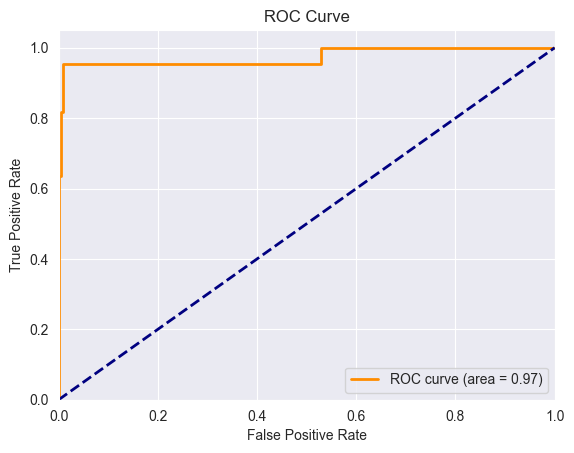

In [99]:
visualize_roc_auc(best_mlpc_resampled_model, X_def, y_def)

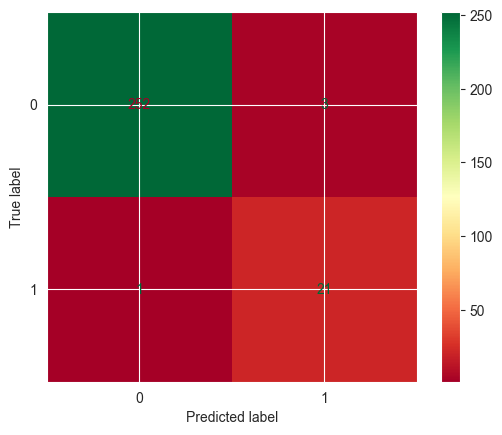

In [100]:
visualize_confusion_matrix(best_mlpc_resampled_model, X_def, y_def)

## Промежуточные выводы

В результате обучения на предобработанных данных качество исходной модели было выше, чем у улучшенной модели обученной с помощью oversampling, но при тестировании на исходных данных улучшенная модель дала лучшие результаты, как по accuracy=0.9855, так и по f1 = 0.913. Данные результаты является лучшими в данной работе.